  <tr>
        <td width="15%">
        </td>
        <td>
            <div align="left">
                <font size=25px>
                    <b>Travel Review Clustering
                    </b>
                </font>
            </div>
        </td>
    </tr>

## Context:
This data set is populated by capturing user ratings from Google reviews. Reviews on attractions from 24 categories across Europe are considered. Google user rating ranges from 1 to 5 and average user rating per category is calculated.

## Data Definition:

Input variables:

1) **User** Unique user id 


2) **Attribute 1:** Average ratings on churches 


3) **Attribute 2:** Average ratings on resorts  


4) **Attribute 3:** Average ratings on beaches  


5) **Attribute 4:** Average ratings on parks  


6) **Attribute 5:** Average ratings on theatres  


7) **Attribute 6:** Average ratings on museums  


8) **Attribute 7:** Average ratings on malls  


9) **Attribute 8:** Average ratings on zoo  


10) **Attribute 9:** Average ratings on restaurants  


11) **Attribute 10:** Average ratings on pubs/bars  


12) **Attribute 11:** Average ratings on local services  


13) **Attribute 12:** Average ratings on burger/pizza shops  


14) **Attribute 13:** Average ratings on hotels/other lodgings  


15) **Attribute 14:** Average ratings on juice bars  


16) **Attribute 15:** Average ratings on art galleries 


17) **Attribute 16:** Average ratings on dance clubs  


18) **Attribute 17:** Average ratings on swimming pools  


19) **Attribute 18:** Average ratings on gyms  


20) **Attribute 19:** Average ratings on bakeries  


21) **Attribute 20:** Average ratings on beauty & spas  


22) **Attribute 21:** Average ratings on cafes  


23) **Attribute 22:** Average ratings on view points  


24) **Attribute 23:** Average ratings on monuments  


25) **Attribute 24:** Average ratings on gardens 




1. **[Import Packages](#import_packages)**
2. **[Read Data](#Read_Data)**
3. **[Data Types and Dimensions](#Data_Types)**
4. **[Data Manipulation](#Data_Manipulation)**
5. **[Statistical Summary](#Statistical_Summary)**    
6. **[Handling Missing Values](#Handling_Missing_Values)**    
7. **[Exploratory Data Analysis](#Exploratory_Data_Analysis)**   
8. **[Hierarchical Clustering](#Hierarchical_Clustering)**
9. **[Conclusion](#Conclusion)**  

<a id='import_packages'></a>
## 1. Import Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Set default setting of seaborn
sns.set()


<a id='Read_Data'></a>
## 2. Read the Data

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>Read the data using read_csv() function from pandas<br> 
                </font>
            </div>
        </td>
    </tr>
</table>

In [2]:
# read the data
raw_data = pd.read_csv('google_review_ratings.csv')

# print the first five rows of the data
raw_data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


<a id='Data_Types'></a>
## 3. Data Types and Dimensions

In [3]:
# check the data types for variables
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>Features that are named as Categories, so we need to rename category with it respective label. Also We will drop 'Unnamed: 25' feature as it is redundant</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Before manipulation of data, let's check dimension of dataset**

In [4]:
# get the shape
print(raw_data.shape)

(5456, 26)


**We see that dataframe has 5456 instances and 26 features**

<a id='Data_Manipulation'></a>
## 4. Data Manipulation
Here we will change features names and remove redundant feature

**Droping redundant feature**

In [5]:
# Using drop() function to remove redundant feature
data = raw_data.drop(['Unnamed: 25'] ,axis = 1)
data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


**Renaming features**

To perform the action we will create list containing actual names of features

In [7]:
column_names = ['user_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']


In [8]:
len(column_names)

25

Applying above columns names to dataframe columns

In [9]:
data.columns = column_names

Checking if changes are applied or not

In [8]:
data.head()

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


Columns are renamed

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theatres               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs_bars              5456 non-null   float64
 11  local_services         5456 non-null   object 
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5456 non-null   float64
 14  juice_bars             5456 non-null   float64
 15  art_

In [12]:
data['local_services'] = pd.to_numeric(data['local_services'])

ValueError: Unable to parse string "2	2." at position 2712

In [13]:
data.iloc[2712,:]

user_id                  User 2713
churches                      1.71
resorts                       1.68
beaches                       1.46
parks                         1.13
theatres                      1.12
museums                       1.15
malls                         1.26
zoo                           1.17
restaurants                   1.59
pubs_bars                     0.85
local_services               2\t2.
burger_pizza_shops             NaN
hotels_other_lodgings         0.84
juice_bars                     5.0
art_galleries                  5.0
dance_clubs                   1.08
swimming_pools                 1.1
gyms                          1.04
bakeries                       5.0
beauty_spas                   4.43
cafes                          5.0
view_points                    5.0
monuments                      5.0
gardens                       2.57
Name: 2712, dtype: object

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>Since local_services is numeric, it is represented as categorical</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Changing data type of local_services**

In [14]:
data.loc[2712, 'local_services'] = data.loc[2712, 'local_services'].replace('\t','.').strip('.')

In [15]:
data.loc[2712, 'local_services']

'2.2'

In [16]:
data[['local_services']] = data[['local_services']].apply(pd.to_numeric) 

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>We have encountered an error specifying that features have a invalid string. So to change data type we need to release this error</b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [17]:
data['local_services'].unique() # Getting all unique values

array([1.7 , 1.73, 1.71, 1.69, 1.67, 1.65, 1.66, 1.64, 1.63, 5.  , 1.56,
       1.55, 1.53, 1.52, 1.51, 1.5 , 1.49, 1.48, 1.46, 2.13, 2.12, 2.1 ,
       2.09, 2.08, 2.07, 2.06, 2.05, 2.04, 2.03, 2.01, 2.  , 1.98, 1.97,
       1.95, 1.93, 1.91, 1.9 , 1.88, 1.86, 1.84, 1.83, 1.81, 1.79, 1.77,
       1.74, 1.72, 1.68, 1.61, 1.6 , 1.59, 1.58, 1.99, 2.47, 2.35, 2.48,
       2.59, 3.39, 2.31, 2.78, 2.79, 2.77, 2.76, 2.75, 2.74, 2.72, 2.71,
       2.69, 2.68, 2.66, 2.65, 2.63, 2.61, 2.57, 2.55, 2.53, 2.51, 2.49,
       1.94, 1.92, 1.82, 1.76, 1.62, 4.08, 4.04, 4.02, 4.01, 4.  , 3.99,
       3.98, 3.96, 3.95, 3.94, 3.93, 3.91, 3.9 , 3.88, 3.87, 3.86, 3.84,
       3.85, 2.17, 3.  , 2.99, 2.82, 2.83, 2.81, 2.8 , 2.73, 2.67, 2.64,
       2.62, 2.54, 2.52, 2.5 , 2.02, 1.57, 1.54, 1.47, 1.87, 1.85, 1.78,
       2.6 , 1.45, 1.43, 1.41, 1.39, 1.37, 1.36, 1.34, 1.32, 1.3 , 1.28,
       1.26, 1.24, 1.22, 1.2 , 1.18, 1.16, 1.14, 1.12, 1.1 , 1.08, 1.07,
       1.05, 1.03, 1.01, 0.99, 0.97, 0.96, 0.94, 0.

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>There is a data as '2\t2.' which cannot be converted to float. So need to remove it</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Drop rows where local_services is equal to '2\t2.'**

In [18]:
# Get row number where local services is invalid
data[data['local_services'] == '2\t2.']['local_services']

Series([], Name: local_services, dtype: float64)

Droping row 2712

In [19]:
data = data.drop(data[data['local_services'] == '2\t2.'].index)

Now, we can changing data type of local_services

In [20]:
data[['local_services']] = data[['local_services']].apply(pd.to_numeric) 

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theatres               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs_bars              5456 non-null   float64
 11  local_services         5456 non-null   float64
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5456 non-null   float64
 14  juice_bars             5456 non-null   float64
 15  art_

In [22]:
miss_values = data.isnull().sum()
miss_values[miss_values > 0]

burger_pizza_shops    1
gardens               1
dtype: int64

In [23]:
data = data.dropna()

In [24]:
data.shape

(5454, 25)

All the features are numeric except the user_id as it is categorical in nature 

In [25]:
data_manipulated = data.copy(deep =True ) # Creating a copy of dataframe

<a id='Statistical_Summary'></a>
## 5. Statistical Summary


In [19]:
# data frame with numerical features
data_manipulated.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5455.000000
mean,1.455720,2.319707,2.489331,2.796886,2.958941,2.89349,3.351395,2.540795,3.126019,2.832729,...,2.206573,1.192801,0.949203,0.822414,0.969811,1.000071,0.965838,1.750537,1.531453,1.560755
std,0.827604,1.421438,1.247815,1.309159,1.339056,1.28240,1.413492,1.111391,1.356802,1.307665,...,1.715961,1.107005,0.973536,0.947911,1.203972,1.193891,0.929853,1.598734,1.316889,1.171756
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.11000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.79000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.905000,2.060000,2.460000,2.670000,2.68000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.682500,2.740000,4.092500,4.312500,3.84000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>The above output illustrates the summary statistics of all the numeric variables like the mean, median(50%), minimum, and maximum values, along with the standard deviation.</b>     </font>
            </div>
        </td>
    </tr>
</table>

In [20]:
# data frame with categorical features
data.describe(include='object')

,user_id
count,5456
unique,5456
top,User 1
freq,1


<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>user_id is unique for all instances</b>     </font>
            </div>
        </td>
    </tr>
</table>

<a id='Handling_Missing_Values'></a>
## 6. Handling Missing Values
If the missing values are not handled properly we may end up drawing an inaccurate inference about the data. Due to improper handling, the result obtained will differ from the ones where the missing values are present.

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>In order to get the count of missing values in each column, we use the in-built function .isnull().sum()
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [27]:
# get the count of missing values
missing_values = data_manipulated.isnull().sum()

# print the count of missing values
print(missing_values[missing_values > 0])

Series([], dtype: int64)


<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>There is only one missing value, so rplacing it with mean</b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [28]:
data_no_missing = data_manipulated.fillna(data_manipulated.mean())

C:\Users\shant\AppData\Local\Temp/ipykernel_16920/3154654579.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_no_missing = data_manipulated.fillna(data_manipulated.mean())


In [29]:
# Rechecking missing values
missing_values = data_no_missing.isnull().sum()

# print the count of missing values
print(missing_values[missing_values > 0])

Series([], dtype: int64)


There are no missing values present in the data.

<a id='Exploratory_Data_Analysis'></a>
## 7. Exploratory Data Analysis


**PDF's of features**

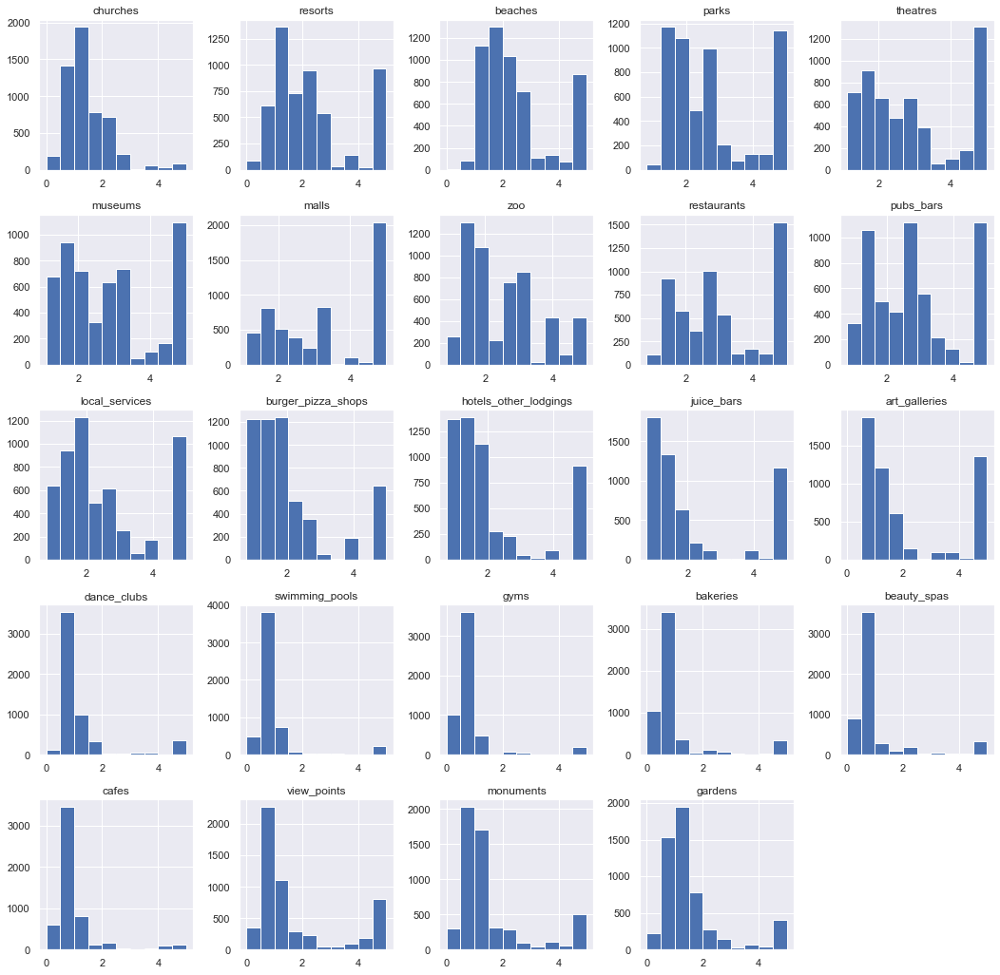

In [30]:
fig = data_no_missing.hist(figsize = (18,18))


**Lets check if users have rated all the features**

In [25]:
data_description = data_no_missing.describe() 
rated = data_description.loc['min'] > 0
rated[rated]


parks                    True
theatres                 True
museums                  True
malls                    True
zoo                      True
restaurants              True
pubs_bars                True
local_services           True
burger_pizza_shops       True
hotels_other_lodgings    True
juice_bars               True
Name: min, dtype: bool

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>The above 11 features have been given a rating by all the users as the minimum value is greater than 0
</b>
                </font>
            </div>
        </td>
    </tr>
</table>

Visualizing number of reviews for each category

In [31]:
# Creating the dataframe containg number of review for each feature
reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=0).sort_values()
reviews

bakeries                 4409
gyms                     4438
beauty_spas              4559
cafes                    4851
swimming_pools           4976
view_points              5109
monuments                5152
gardens                  5229
churches                 5259
dance_clubs              5342
resorts                  5364
art_galleries            5450
beaches                  5450
pubs_bars                5454
local_services           5454
zoo                      5454
hotels_other_lodgings    5454
juice_bars               5454
malls                    5454
museums                  5454
theatres                 5454
parks                    5454
restaurants              5454
burger_pizza_shops       5454
dtype: int64

In [27]:
column_names = data_no_missing.columns.values

Text(0.5, 1.0, 'No of reviews under each category')

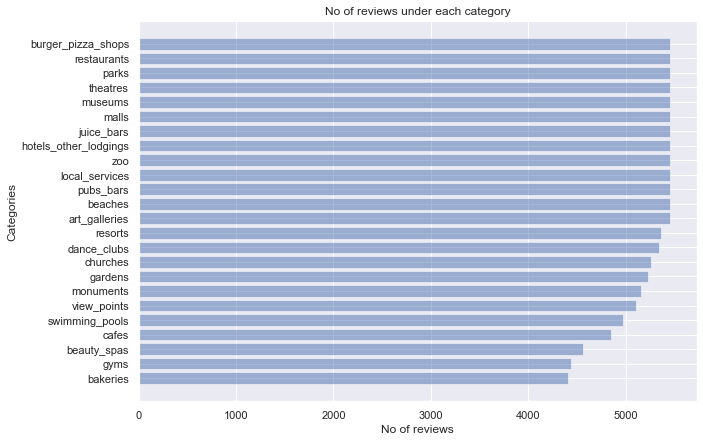

In [32]:
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), reviews.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), reviews.index)
plt.xlabel('No of reviews')
plt.ylabel('Categories')
plt.title('No of reviews under each category')

**Now let's check how many users have given reviews to the features**

In [33]:
# Creating a dataframe to store number of reviews by users
no_of_reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=1).value_counts()
no_of_reviews

24    3724
23     505
21     457
20     243
22     167
19     147
18     114
17      69
16      22
15       6
dtype: int64

Text(0.5, 1.0, 'No of Categories vs No of reviews')

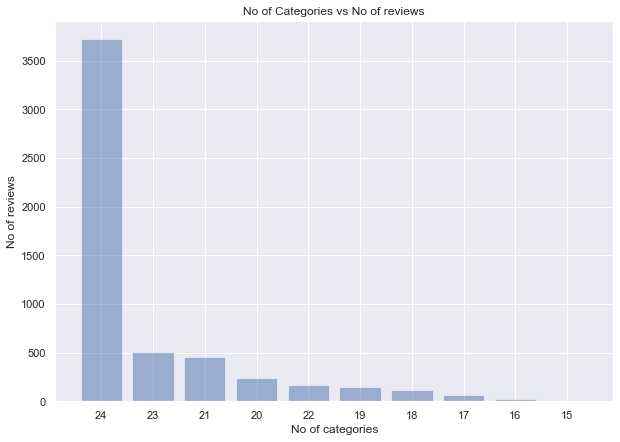

In [34]:
# Plotting the number of customers vs numbe of review
plt.figure(figsize=(10,7))
plt.bar(np.arange(len(no_of_reviews)), no_of_reviews.values, align='center', alpha=0.5)
plt.xticks(np.arange(len(no_of_reviews)), no_of_reviews.index)
plt.ylabel('No of reviews')
plt.xlabel('No of categories')
plt.title('No of Categories vs No of reviews')

**Conclusion**

Around 3500 users have given a rating for all the 24 categories and the least no of rating given by a user is 15. So for users with lesser number of ratings a recommender system can be built

**Now let's check Average rating per feature**

In [36]:
# Creating a dataframe to store average rating for each feature
avg_rating = data_no_missing[column_names[1:]].mean() # average rating is calculated by dividing count by it's mean
avg_rating = avg_rating.sort_values(ascending = False) # sorting the rating in increasing order
avg_rating

malls                    3.351476
restaurants              3.126542
theatres                 2.958904
museums                  2.893423
pubs_bars                2.832695
parks                    2.797103
local_services           2.549622
zoo                      2.541177
beaches                  2.489059
resorts                  2.320048
art_galleries            2.206140
juice_bars               2.190429
hotels_other_lodgings    2.125820
burger_pizza_shops       2.078401
view_points              1.749345
gardens                  1.560570
monuments                1.531051
churches                 1.455746
dance_clubs              1.192710
beauty_spas              0.999626
bakeries                 0.969250
cafes                    0.965275
swimming_pools           0.949349
gyms                     0.822525
dtype: float64

Text(0.5, 1.0, 'Average rating per Category')

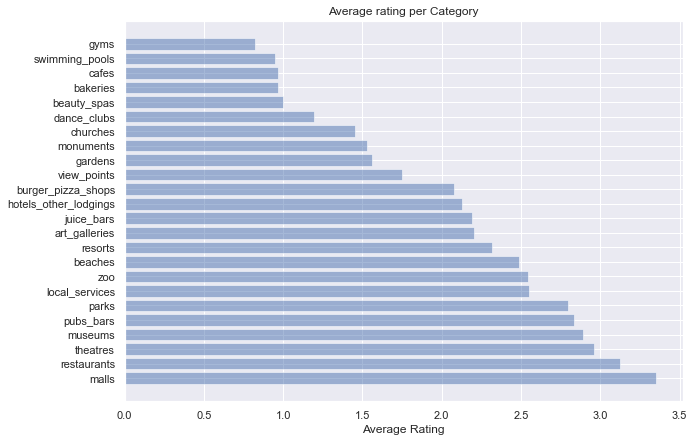

In [37]:
# Plotting average rating plots
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), avg_rating.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), avg_rating.index)
plt.xlabel('Average Rating')
plt.title('Average rating per Category')

In [ ]:
data_1 = data_no_missing.copy()


Creating a id column

In [39]:
data_1 = data_no_missing.copy()

new = data_1['user_id'].str.split(' ',n=2,expand=True)
data_1['user'] = new[0]
data_1['id'] = new[1]
data_1 = data_1.drop(['user_id','user'],axis=1)
data_1.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


In [40]:
data_final = data_1.copy(deep = True)
data_final.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5


In [41]:
pd.DataFrame(np.count_nonzero(data_final, axis=0), index=data_final.columns, columns=['Value']).sort_values('Value')

,Value
bakeries,4409
gyms,4438
beauty_spas,4559
cafes,4851
swimming_pools,4976
view_points,5109
monuments,5152
gardens,5229
churches,5259
dance_clubs,5342


<a id='Hierarchical_Clustering'></a>
## 8. Hierarchical Clustering

**import relevant packages**

In [44]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import scale as s
from scipy.cluster.hierarchy import dendrogram, linkage

In [45]:
Z = sch.linkage(data_final,method='ward')
Z


array([[2.99000000e+02, 3.00000000e+02, 1.00005000e+00, 2.00000000e+00],
       [6.72000000e+02, 6.73000000e+02, 1.00005000e+00, 2.00000000e+00],
       [2.15900000e+03, 2.16000000e+03, 1.00005000e+00, 2.00000000e+00],
       ...,
       [1.08980000e+04, 1.09010000e+04, 3.22713808e+04, 2.06300000e+03],
       [1.09020000e+04, 1.09030000e+04, 6.91444681e+04, 3.39100000e+03],
       [1.09040000e+04, 1.09050000e+04, 1.38193891e+05, 5.45400000e+03]])

Text(0.5, 1.0, 'Hierarchical Clustering')

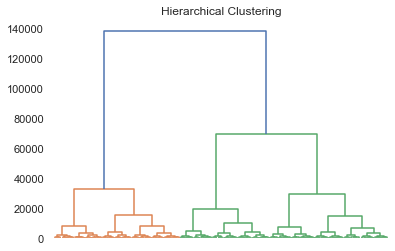

In [46]:
# Creating and plotting a dendogram
den = sch.dendrogram(Z)
plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,     
    top=False,         
    labelbottom=False) 
plt.title('Hierarchical Clustering')


<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>The number of clusters will be the number of vertical lines which are being intersected by the line drawn using the threshold. So we need to determine the cutting line.</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Creating a function to determine the cutting line**


In [47]:
def fd(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

**Creating a dendogram with cutting line**

Observing the height of each dendrogram division we decided to go with 80000 where the line would be drawn and 30000 to determine the dendrogram nodes

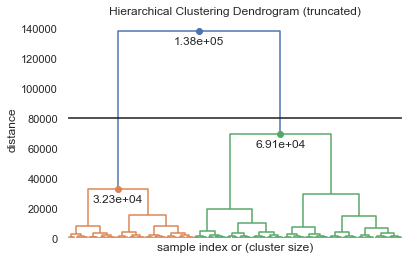

In [48]:
fd(Z,leaf_rotation=90.,show_contracted=True,annotate_above=30000,max_d=80000)
plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,     
    top=False,         
    labelbottom=False)

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>We can see that there are basically 2 clusters possible</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Creating a hierarchical clustering model**

In [61]:
# Importing packages
from sklearn.cluster import AgglomerativeClustering 

In [71]:
# Creating a Agglomerative Clustering
hc_model = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage ='ward')

In [72]:
# Fitting the model
y_cluster = hc_model.fit_predict(data_final)

Adding the cluster column

In [73]:
data_clustered = data_final.copy()

In [74]:
data_clustered["Cluster"] = y_cluster.astype('object')

In [75]:
data_clustered.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1,1
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,1
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3,1
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,1
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5,1


In [76]:
data_clustered.Cluster.value_counts()

0    3391
1    2063
Name: Cluster, dtype: int64

**Visualizing the clusters**

In [77]:
cols = list(data_final.columns)
#cols.remove("user_id")
cols

['churches',
 'resorts',
 'beaches',
 'parks',
 'theatres',
 'museums',
 'malls',
 'zoo',
 'restaurants',
 'pubs_bars',
 'local_services',
 'burger_pizza_shops',
 'hotels_other_lodgings',
 'juice_bars',
 'art_galleries',
 'dance_clubs',
 'swimming_pools',
 'gyms',
 'bakeries',
 'beauty_spas',
 'cafes',
 'view_points',
 'monuments',
 'gardens',
 'id']

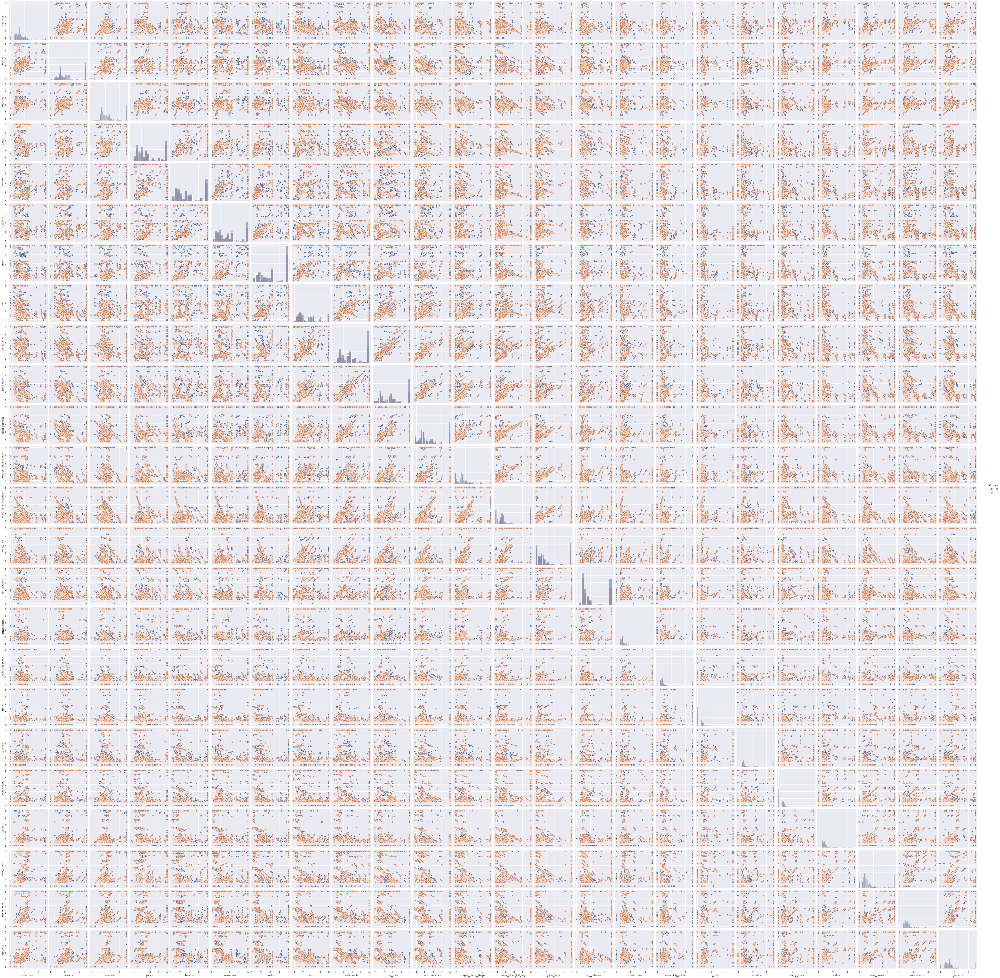

In [57]:
#sns.pairplot(data_clustered, hue="Cluster", diag_kind="hist")

In [69]:
data_clustered.columns

Index(['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums',
       'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services',
       'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars',
       'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries',
       'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens', 'id',
       'Cluster'],
      dtype='object')

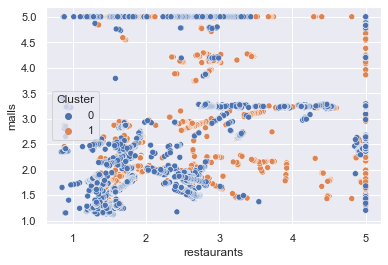

In [78]:
sns.scatterplot(x='restaurants',y='malls', hue='Cluster', data=data_clustered)
plt.show()

<a id='Conclusion'></a>
## 9. Conclusion

By using heirarchical clustering we clustered review into two category, positive review and a negeative review

In [50]:
result = data_clustered.copy()

In [51]:
result.replace({'Cluster' : 1} , 'Positive' , inplace=True)
result.replace({'Cluster' : 0} , 'Negeative' , inplace= True)


In [52]:
result.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1,Positive
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,Positive
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,3,Positive
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,Positive
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,5,Positive


In [54]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   churches               5456 non-null   float64
 1   resorts                5456 non-null   float64
 2   beaches                5456 non-null   float64
 3   parks                  5456 non-null   float64
 4   theatres               5456 non-null   float64
 5   museums                5456 non-null   float64
 6   malls                  5456 non-null   float64
 7   zoo                    5456 non-null   float64
 8   restaurants            5456 non-null   float64
 9   pubs_bars              5456 non-null   float64
 10  local_services         5456 non-null   float64
 11  burger_pizza_shops     5456 non-null   float64
 12  hotels_other_lodgings  5456 non-null   float64
 13  juice_bars             5456 non-null   float64
 14  art_galleries          5456 non-null   float64
 15  danc

In [76]:
import fastcluster as fc
import numpy as np
from scipy.cluster.hierarchy import cophenet

Z = fc.linkage_vector(data_final.iloc[:,0:-1])         # Clustering
#Z = sch.linkage(data_final,method='ward')

orign_dists = fc.pdist(data_final.iloc[:,0:-1])  # Matrix of original distances between observations
cophe_dists = cophenet(Z)  # Matrix of cophenetic distances between observations

# What I really want at the end of the day is
corr_coef = np.corrcoef(orign_dists, cophe_dists)[0,1]

In [77]:
corr_coef

0.47502863360930764

In [79]:
Z[:10]

array([[2.000e+00, 4.000e+00, 0.000e+00, 2.000e+00],
       [1.338e+03, 1.346e+03, 0.000e+00, 2.000e+00],
       [6.700e+02, 6.740e+02, 0.000e+00, 2.000e+00],
       [4.989e+03, 4.990e+03, 1.000e-02, 2.000e+00],
       [3.253e+03, 3.254e+03, 1.000e-02, 2.000e+00],
       [2.957e+03, 2.959e+03, 1.000e-02, 2.000e+00],
       [1.927e+03, 1.929e+03, 1.000e-02, 2.000e+00],
       [2.160e+03, 2.161e+03, 1.000e-02, 2.000e+00],
       [1.341e+03, 1.345e+03, 1.000e-02, 2.000e+00],
       [1.339e+03, 5.464e+03, 1.000e-02, 3.000e+00]])

In [80]:
data_final.drop('id', axis=1, inplace=True)

## KMeans Clustering

In [81]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [84]:
score = []
for k in range(2, 20):
    km = KMeans(n_clusters = k)
    km.fit(data_final)
    print("K: {}; Score : {}".format(k, silhouette_score(data_final, km.labels_)))
    score.append(silhouette_score(data_final, km.labels_))

K: 2; Score : 0.14431444662212622
K: 3; Score : 0.14444636220975185
K: 4; Score : 0.147032085394168
K: 5; Score : 0.1522575929749364
K: 6; Score : 0.1500720511124734
K: 7; Score : 0.1565654127525589
K: 8; Score : 0.15192539047100412
K: 9; Score : 0.1557917313311054
K: 10; Score : 0.15877881328058902
K: 11; Score : 0.16148679693557869
K: 12; Score : 0.1527074843401291
K: 13; Score : 0.16544063602279216
K: 14; Score : 0.1538137325801006
K: 15; Score : 0.16215802759238798
K: 16; Score : 0.15755976115685816
K: 17; Score : 0.16176325401117567
K: 18; Score : 0.1660399555444074
K: 19; Score : 0.1555882762321382


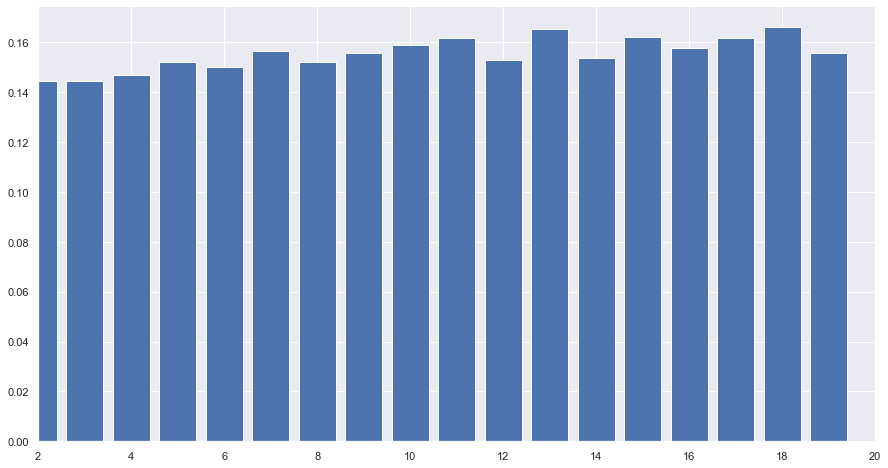

In [89]:
plt.figure(figsize=(15,8))
plt.bar(range(2,20), score)
plt.xlim(2,20)
plt.show()

In [90]:
km = KMeans(n_clusters=18, random_state=42)
km.fit(data_final)

KMeans(n_clusters=18, random_state=42)

In [91]:
data_final.columns

Index(['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums',
       'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services',
       'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars',
       'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries',
       'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens'],
      dtype='object')

In [92]:
data_final['cluster'] = km.labels_

In [100]:
sns.color_palette()

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

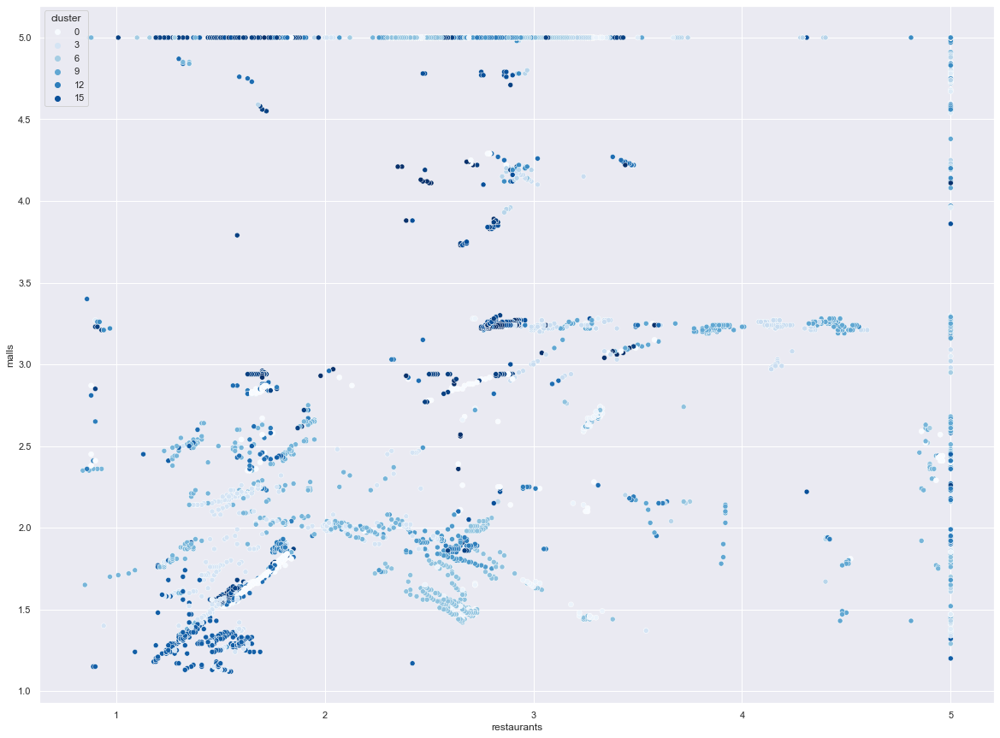

In [101]:
plt.figure(figsize=(20,15))
sns.scatterplot(x='restaurants', y='malls', hue='cluster', data=data_final, palette='Blues')
plt.show()